# Exploratory Pretrained Models

Here we explore some pretrained audio and NLP models from [tfhub](https://tfhub.dev/), [huggingface models](https://huggingface.co/models), and [laughter-detection](https://github.com/jrgillick/laughter-detection) to see how well they work on podcast audio and compare their outputs. We also compare with the low-level functionals.

In [1]:
# Load the required libraries

%load_ext autoreload
%autoreload 2

import json
import subprocess as sp

import tensorflow as tf
import tensorflow_hub as hub
from transformers import T5ForConditionalGeneration, T5Tokenizer, AutoTokenizer, AutoModelWithLMHead
import numpy as np
import csv
import io
import matplotlib.pyplot as plt
from IPython.display import Audio
import librosa

import src.data

In [2]:
# Setup the GPUs for usage

def gpu_setup(level=7000):
    """Function to setup memory growth on all available GPUs."""
    _output_to_list = lambda x: x.decode('ascii').split('\n')[:-1]
    ACCEPTABLE_AVAILABLE_MEMORY = 1024
    COMMAND = "nvidia-smi --query-gpu=memory.free --format=csv"
    memory_free_info = _output_to_list(sp.check_output(COMMAND.split()))[1:]
    values = [int(x.split()[0]) for i, x in enumerate(memory_free_info)]
    free = [True if val>level else False for val in values]
    gpus = tf.config.list_physical_devices('GPU')
    to_use = []
    for free, gpu in zip(free, gpus):
        if free:
            tf.config.experimental.set_memory_growth(gpu, True)
            to_use.append(gpu)
    try:
        tf.config.experimental.set_visible_devices(to_use, 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "actual GPUs,", len(logical_gpus), "in use.")
    except RuntimeError as e:
        print(e)
    
gpu_setup()

4 actual GPUs, 3 in use.


## Load a good podcast episode

Here we examine an episode of "This Particular Album is Very, Very Important to Me". It has both speech and music, with multiple speakers and a decent amount of laughter. For clearer analysis, we will only consider the first five minutes of the podcast here.

In [3]:
# Load the podcast metadata
metadata = src.data.load_metadata()
episode_pre = metadata["episode_filename_prefix"]
show_pre = metadata["show_filename_prefix"]
paths = [src.data.find_file_paths(sp, ep) for sp, ep in zip(show_pre, episode_pre)]
#metadata["show_name"].where(metadata['show_name'] == "The Receipts Podcast").dropna().index
#metadata["episode_filename_prefix"].where(metadata['episode_filename_prefix'] == "004tF9AGNDnp6eOqYVT3pg").dropna().index

In [4]:
# Load the audio and transcript from a podcast
podcast_index = 17 # 102659
length = 300
transcript = src.data.retrieve_timestamped_transcript(paths[podcast_index][0])
audio, sr = librosa.load(paths[podcast_index][1], duration=length, sr=16000)

## Segment the transcript

We split the podcast transcript into segments of 20 words overlapping by 10 words, with the associated time being the mean time of each segment's word times. This procedure needs to be explored in greater detail as it ties into the question of context in emotion recognition.

In [5]:
segment_words = 20
segments = []
times = []
for i in range(0, len(transcript["words"]), int(segment_words/2)):
    segments.append(" ".join(transcript["words"][i:i+segment_words]))
    times.append(np.mean(transcript["starts"][i:i+segment_words]))
    if transcript["starts"][i] >= length:
        break

## Run through pretrained transformers

We run the audio through both the [kiri-ai/t5-base-qa-summary-emotion](https://huggingface.co/kiri-ai/t5-base-qa-summary-emotion) and [mrm8488/t5-base-finetuned-emotion](https://huggingface.co/mrm8488/t5-base-finetuned-emotion) models. Both are T5-based finetuned models using the [GoEmotions](https://github.com/google-research/google-research/tree/master/goemotions) and [dair-ai emotions](https://github.com/dair-ai/emotion_dataset) datasets respectively.

In [6]:
go_emotions_tokenizer = T5Tokenizer.from_pretrained("kiri-ai/t5-base-qa-summary-emotion", cache_dir="/mnt/storage/cdtdisspotify/transformers")
go_emotions_model = T5ForConditionalGeneration.from_pretrained("kiri-ai/t5-base-qa-summary-emotion", cache_dir="/mnt/storage/cdtdisspotify/transformers")

def get_go_emotion(text):
    input_text = f"emotion: {text}"
    features = go_emotions_tokenizer([input_text], return_tensors='pt')
    tokens = go_emotions_model.generate(input_ids=features['input_ids'], attention_mask=features['attention_mask'], max_length=64)
    return go_emotions_tokenizer.decode(tokens[0], skip_special_tokens=True)

In [7]:
emotions_tokenizer = AutoTokenizer.from_pretrained("mrm8488/t5-base-finetuned-emotion", cache_dir="/mnt/storage/cdtdisspotify/transformers")
emotions_model = AutoModelWithLMHead.from_pretrained("mrm8488/t5-base-finetuned-emotion", cache_dir="/mnt/storage/cdtdisspotify/transformers")

def get_emotion(text):
    input_ids = emotions_tokenizer.encode(text + '</s>', return_tensors='pt')
    output = emotions_model.generate(input_ids=input_ids, max_length=2)
    dec = [emotions_tokenizer.decode(ids) for ids in output]
    label = dec[0]
    return label.strip("<pad>")

/unix/cdtdisspotify/jtingey/my-podcasts/lib/python3.8/site-packages/transformers-4.3.3-py3.8.egg/transformers/models/auto/modeling_auto.py:966: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.


In [8]:
%%time
go_emotions = []
emotions = []
for segment in segments:
    go_emotions.append(get_go_emotion(segment))
    emotions.append(get_emotion(segment))

CPU times: user 2min 58s, sys: 85.9 ms, total: 2min 58s
Wall time: 9.92 s


## Run through pretrained YAMNet

We run the audio through the [YAMNet model](https://tfhub.dev/google/yamnet/1) to classify segments of the audio according to the AudioSet ontology.

In [9]:
audio_model = hub.load('https://tfhub.dev/google/yamnet/1')

def class_names_from_csv(class_map_csv_text):
    """Returns list of class names corresponding to score vector."""
    class_map_csv = io.StringIO(class_map_csv_text)
    class_names = [display_name for (class_index, mid, display_name) in csv.reader(class_map_csv)]
    class_names = class_names[1:]  # Skip CSV header
    return class_names

INFO:absl:Using /tmp/tfhub_modules to cache modules.


In [10]:
%%time
scores, embeddings, spectrogram = audio_model(audio)
class_map_path = audio_model.class_map_path().numpy()
class_names = class_names_from_csv(tf.io.read_file(class_map_path).numpy().decode('utf-8'))
scores_np = scores.numpy()
spectrogram_np = spectrogram.numpy()

CPU times: user 3.12 s, sys: 16.7 s, total: 19.8 s
Wall time: 37.4 s


## Plot everything together

We also load the laughter labels from a separate test of the [laughter-detection](https://github.com/jrgillick/laughter-detection) pretrained model on the same segment of podcast audio.

In [11]:
laughter = np.zeros(length*10)
f = open("/unix/cdtdisspotify/jtingey/laughter-detection/test/laughs/list.txt", "r")
for i, x in enumerate(f):
    if i == 0:
        continue
    else:
        y = json.loads(x.replace("'", '"'))
        laughter[int(np.round(y["start"], 1)*10):int(np.round(y["end"], 1)*10)] = 1.0

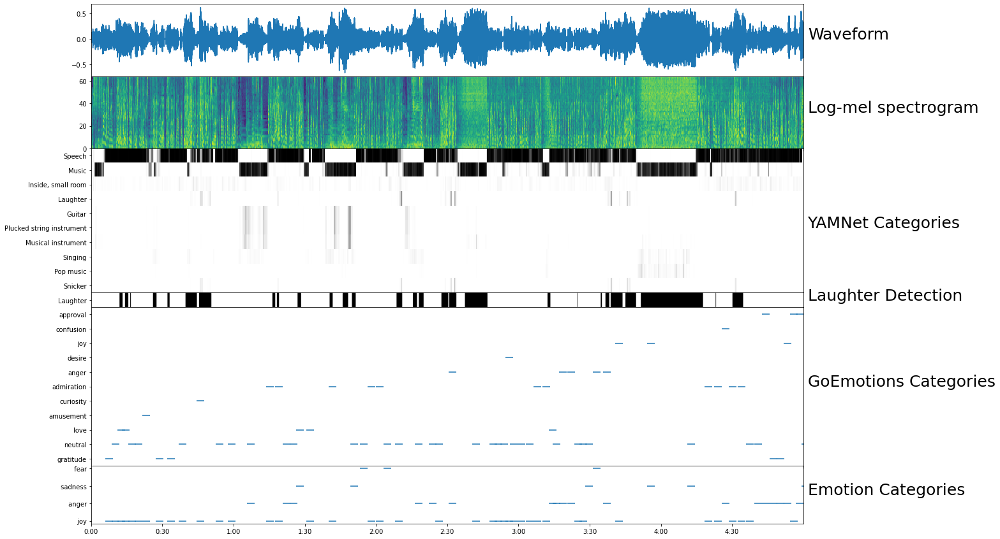

In [12]:
fig, axs = plt.subplots(6, 1, figsize=(20, 15), gridspec_kw={"hspace": 0.0, "height_ratios": [0.5, 0.5, 1, 0.1, 1.1, 0.4]})

# Plot the waveform.
time_axis = np.arange(0, length, 1/16000)
axs[0].plot(time_axis, audio)
axs[0].set_xlim([0, length])
axs[0].text(302, 0, "Waveform", fontsize=25)

# Plot the log-mel spectrogram (returned by the model).
axs[1].imshow(spectrogram_np.T, aspect='auto', interpolation='nearest', origin='lower', extent=[0,length,0,64])
axs[1].text(302, 32, "Log-mel spectrogram", fontsize=25)

# Plot and label the model output scores for the top-scoring classes.
mean_scores = np.mean(scores, axis=0)
top_n = 10
top_class_indices = np.argsort(mean_scores)[::-1][:top_n]
axs[2].imshow(scores_np[:, top_class_indices].T, aspect='auto', interpolation='nearest', cmap='gray_r')
patch_padding = (0.025 / 2) / 0.01
axs[2].set_xlim([-patch_padding-0.5, scores.shape[0] + patch_padding-0.5])
# Label the top_N classes.
yticks = range(0, top_n, 1)
axs[2].set_yticks(yticks)
axs[2].set_yticklabels([class_names[top_class_indices[x]] for x in yticks])
axs[2].set_ylim(-0.5 + np.array([top_n, 0]))
axs[2].text(628, 5, "YAMNet Categories", fontsize=25)

# Plot the laugher detection segments
axs[3].imshow(np.expand_dims(laughter, axis=0), aspect="auto", cmap="binary")
axs[3].text(3020, 0, "Laughter Detection", fontsize=25)
yticks = range(0, 1, 1)
axs[3].set_yticks(yticks)
axs[3].set_yticklabels(["Laughter"])

# Plot the transcript emotions
axs[4].scatter(times, go_emotions, marker="_", s=150)
axs[4].set_xlim([0, length])
axs[4].text(302, 5, "GoEmotions Categories", fontsize=25)

# Plot the transcript emotions
axs[5].scatter(times, emotions, marker="_", s=150)
axs[5].set_xlim([0, length])
axs[5].text(302, 1.5, "Emotion Categories", fontsize=25)

xticks = np.arange(0, 300, 30)
axs[5].set_xticks(xticks)
axs[5].set_xticklabels(["0:00", "0:30", "1:00", "1:30", "2:00", "2:30", "3:00", "3:30", "4:00", "4:30"])

for ax in fig.get_axes():
    ax.label_outer()

plt.show()

In [14]:
Audio(audio, rate=sr)

## Conclusions

- Laughter detection gets confused with music, but otherwise seems to perform very well.
- The language models get confused with emotion easily e.g anger is when people swear even if in a really positive way.
- Music detection is very easy